In [82]:
import pandas as pd 
import numpy as np 
import seaborn as sns 
import matplotlib.pyplot as plt
import statsmodels.formula.api as smf

In [83]:
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import MinMaxScaler
import warnings
warnings.filterwarnings('ignore')

In [84]:
data=pd.read_csv("co2_emissions (1).csv",sep=";")
data 

,make,model,vehicle_class,engine_size,cylinders,transmission,fuel_type,fuel_consumption_city,fuel_consumption_hwy,fuel_consumption_comb(l/100km),fuel_consumption_comb(mpg),co2_emissions
0,ACURA,ILX,COMPACT,2.0,4,AS,Z,9.9,6.7,8.5,33,196
1,ACURA,ILX,COMPACT,2.4,4,M,Z,11.2,7.7,9.6,29,221
2,ACURA,ILX HYBRID,COMPACT,1.5,4,AV,Z,6.0,5.8,5.9,48,136
3,ACURA,MDX 4WD,SUV - SMALL,3.5,6,AS,Z,12.7,9.1,11.1,25,255
4,ACURA,RDX AWD,SUV - SMALL,3.5,6,AS,Z,12.1,8.7,10.6,27,244
5,ACURA,RLX,MID-SIZE,3.5,6,AS,Z,11.9,7.7,10.0,28,230
6,ACURA,TL,MID-SIZE,3.5,6,AS,Z,11.8,8.1,10.1,28,232
7,ACURA,TL AWD,MID-SIZE,3.7,6,AS,Z,12.8,9.0,11.1,25,255
8,ACURA,TL AWD,MID-SIZE,3.7,6,M,Z,13.4,9.5,11.6,24,267
9,ACURA,TSX,COMPACT,2.4,4,AS,Z,10.6,7.5,9.2,31,212


In [85]:
pd.set_option("display.max_rows",None)
data 

,make,model,vehicle_class,engine_size,cylinders,transmission,fuel_type,fuel_consumption_city,fuel_consumption_hwy,fuel_consumption_comb(l/100km),fuel_consumption_comb(mpg),co2_emissions
0,ACURA,ILX,COMPACT,2.0,4,AS,Z,9.9,6.7,8.5,33,196
1,ACURA,ILX,COMPACT,2.4,4,M,Z,11.2,7.7,9.6,29,221
2,ACURA,ILX HYBRID,COMPACT,1.5,4,AV,Z,6.0,5.8,5.9,48,136
3,ACURA,MDX 4WD,SUV - SMALL,3.5,6,AS,Z,12.7,9.1,11.1,25,255
4,ACURA,RDX AWD,SUV - SMALL,3.5,6,AS,Z,12.1,8.7,10.6,27,244
5,ACURA,RLX,MID-SIZE,3.5,6,AS,Z,11.9,7.7,10.0,28,230
6,ACURA,TL,MID-SIZE,3.5,6,AS,Z,11.8,8.1,10.1,28,232
7,ACURA,TL AWD,MID-SIZE,3.7,6,AS,Z,12.8,9.0,11.1,25,255
8,ACURA,TL AWD,MID-SIZE,3.7,6,M,Z,13.4,9.5,11.6,24,267
9,ACURA,TSX,COMPACT,2.4,4,AS,Z,10.6,7.5,9.2,31,212


# EDA

In [86]:
data.shape

(7385, 12)

In [87]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7385 entries, 0 to 7384
Data columns (total 12 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   make                            7385 non-null   object 
 1   model                           7385 non-null   object 
 2   vehicle_class                   7385 non-null   object 
 3   engine_size                     7385 non-null   float64
 4   cylinders                       7385 non-null   int64  
 5   transmission                    7385 non-null   object 
 6   fuel_type                       7385 non-null   object 
 7   fuel_consumption_city           7385 non-null   float64
 8   fuel_consumption_hwy            7385 non-null   float64
 9   fuel_consumption_comb(l/100km)  7385 non-null   float64
 10  fuel_consumption_comb(mpg)      7385 non-null   int64  
 11  co2_emissions                   7385 non-null   int64  
dtypes: float64(4), int64(3), object(5)

In [88]:
data.describe()

,engine_size,cylinders,fuel_consumption_city,fuel_consumption_hwy,fuel_consumption_comb(l/100km),fuel_consumption_comb(mpg),co2_emissions
count,7385.000000,7385.000000,7385.000000,7385.000000,7385.000000,7385.000000,7385.000000
mean,3.160068,5.615030,12.556534,9.041706,10.975071,27.481652,250.584699
std,1.354170,1.828307,3.500274,2.224456,2.892506,7.231879,58.512679
min,0.900000,3.000000,4.200000,4.000000,4.100000,11.000000,96.000000
25%,2.000000,4.000000,10.100000,7.500000,8.900000,22.000000,208.000000
50%,3.000000,6.000000,12.100000,8.700000,10.600000,27.000000,246.000000
75%,3.700000,6.000000,14.600000,10.200000,12.600000,32.000000,288.000000
max,8.400000,16.000000,30.600000,20.600000,26.100000,69.000000,522.000000


In [89]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
engine_size,7385.0,3.160068,1.354170,0.9,2.0,3.0,3.7,8.4
cylinders,7385.0,5.615030,1.828307,3.0,4.0,6.0,6.0,16.0
fuel_consumption_city,7385.0,12.556534,3.500274,4.2,10.1,12.1,14.6,30.6
fuel_consumption_hwy,7385.0,9.041706,2.224456,4.0,7.5,8.7,10.2,20.6
fuel_consumption_comb(l/100km),7385.0,10.975071,2.892506,4.1,8.9,10.6,12.6,26.1
fuel_consumption_comb(mpg),7385.0,27.481652,7.231879,11.0,22.0,27.0,32.0,69.0
co2_emissions,7385.0,250.584699,58.512679,96.0,208.0,246.0,288.0,522.0


In [90]:
data.dtypes

make                               object
model                              object
vehicle_class                      object
engine_size                       float64
cylinders                           int64
transmission                       object
fuel_type                          object
fuel_consumption_city             float64
fuel_consumption_hwy              float64
fuel_consumption_comb(l/100km)    float64
fuel_consumption_comb(mpg)          int64
co2_emissions                       int64
dtype: object

In [91]:
data.make.value_counts()

FORD             628
CHEVROLET        588
BMW              527
MERCEDES-BENZ    419
PORSCHE          376
TOYOTA           330
GMC              328
AUDI             286
NISSAN           259
JEEP             251
DODGE            246
KIA              231
HONDA            214
HYUNDAI          210
MINI             204
VOLKSWAGEN       197
MAZDA            180
LEXUS            178
JAGUAR           160
CADILLAC         158
SUBARU           140
VOLVO            124
INFINITI         108
BUICK            103
RAM               97
LINCOLN           96
MITSUBISHI        95
CHRYSLER          88
LAND ROVER        85
FIAT              73
ACURA             72
MASERATI          61
ROLLS-ROYCE       50
ASTON MARTIN      47
BENTLEY           46
LAMBORGHINI       41
ALFA ROMEO        30
GENESIS           25
SCION             22
SMART              7
BUGATTI            3
SRT                2
Name: make, dtype: int64

In [92]:
data.model.value_counts()

F-150 FFV 4X4                                32
F-150 FFV                                    32
MUSTANG                                      27
FOCUS FFV                                    24
SONIC                                        20
SONIC 5                                      20
F-150 4X4                                    20
F-150                                        20
ACCORD                                       19
COMPASS                                      19
JETTA                                        19
ATS                                          19
TACOMA 4WD                                   19
CAMARO                                       18
SIERRA                                       18
COROLLA                                      18
SIERRA 4WD                                   18
SILVERADO 4WD                                18
SILVERADO                                    18
FORTE 5                                      18
PATRIOT                                 

In [93]:
data.vehicle_class.value_counts()

SUV - SMALL                 1217
MID-SIZE                    1133
COMPACT                     1022
SUV - STANDARD               735
FULL-SIZE                    639
SUBCOMPACT                   606
PICKUP TRUCK - STANDARD      538
TWO-SEATER                   460
MINICOMPACT                  326
STATION WAGON - SMALL        252
PICKUP TRUCK - SMALL         159
MINIVAN                       80
SPECIAL PURPOSE VEHICLE       77
VAN - PASSENGER               66
STATION WAGON - MID-SIZE      53
VAN - CARGO                   22
Name: vehicle_class, dtype: int64

In [94]:
data.transmission.value_counts()

AS    3127
A     1851
M     1185
AM     646
AV     576
Name: transmission, dtype: int64

In [95]:
data.fuel_type.value_counts()

X    3637
Z    3202
E     370
D     175
N       1
Name: fuel_type, dtype: int64

In [96]:
data.isnull().sum()

make                              0
model                             0
vehicle_class                     0
engine_size                       0
cylinders                         0
transmission                      0
fuel_type                         0
fuel_consumption_city             0
fuel_consumption_hwy              0
fuel_consumption_comb(l/100km)    0
fuel_consumption_comb(mpg)        0
co2_emissions                     0
dtype: int64

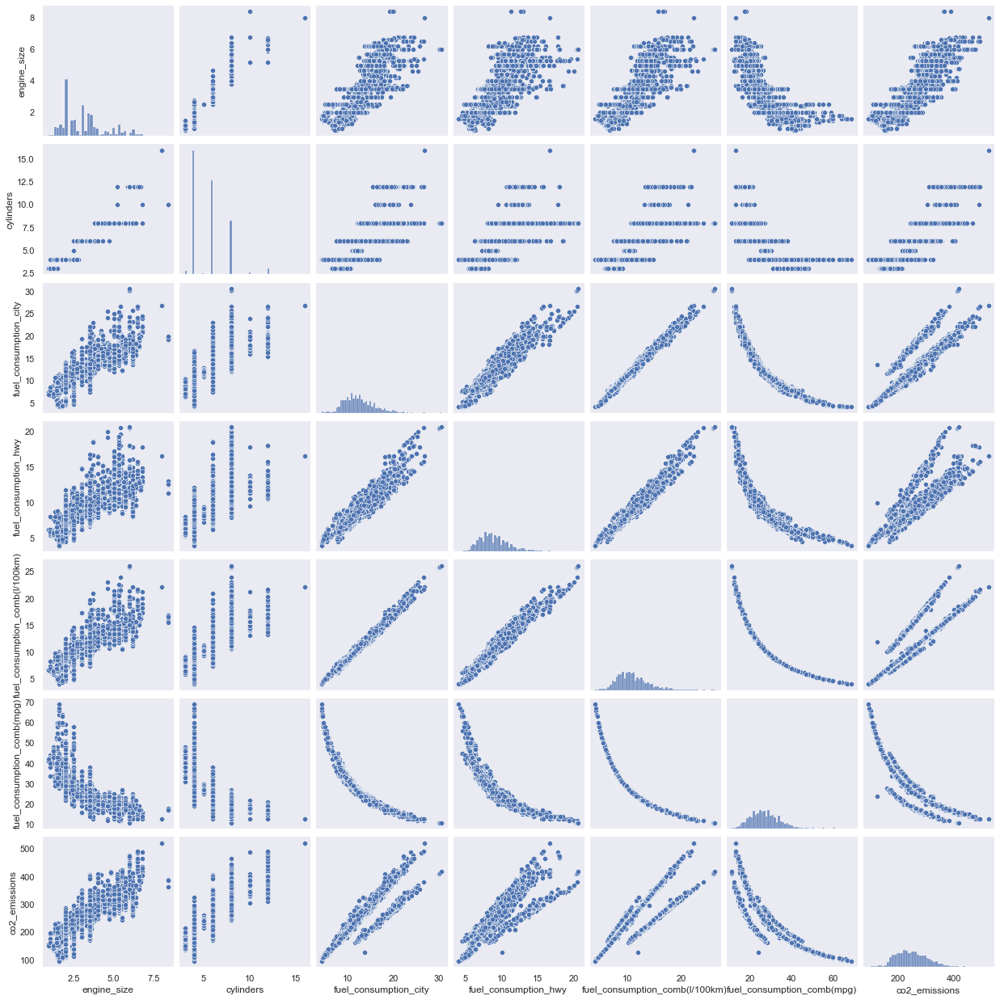

In [97]:
sns.pairplot(data)

In [98]:
data.columns

Index(['make', 'model', 'vehicle_class', 'engine_size', 'cylinders',
       'transmission', 'fuel_type', 'fuel_consumption_city',
       'fuel_consumption_hwy', 'fuel_consumption_comb(l/100km)',
       'fuel_consumption_comb(mpg)', 'co2_emissions'],
      dtype='object')

In [99]:
data[data.duplicated()]

,make,model,vehicle_class,engine_size,cylinders,transmission,fuel_type,fuel_consumption_city,fuel_consumption_hwy,fuel_consumption_comb(l/100km),fuel_consumption_comb(mpg),co2_emissions
1075,ACURA,RDX AWD,SUV - SMALL,3.5,6,AS,Z,12.1,8.7,10.6,27,244
1076,ACURA,RLX,MID-SIZE,3.5,6,AS,Z,11.9,7.7,10.0,28,230
1081,ALFA ROMEO,4C,TWO-SEATER,1.8,4,AM,Z,9.7,6.9,8.4,34,193
1082,ASTON MARTIN,DB9,MINICOMPACT,5.9,12,A,Z,18.0,12.6,15.6,18,359
1084,ASTON MARTIN,V8 VANTAGE,TWO-SEATER,4.7,8,AM,Z,17.4,11.3,14.7,19,338
1086,ASTON MARTIN,V8 VANTAGE S,TWO-SEATER,4.7,8,AM,Z,17.4,11.3,14.7,19,338
1104,AUDI,A6 QUATTRO,MID-SIZE,3.0,6,AS,Z,12.8,8.6,10.9,26,251
1105,AUDI,A6 QUATTRO TDI (modified),MID-SIZE,3.0,6,AS,D,9.8,6.2,8.1,35,217
1107,AUDI,A7 QUATTRO TDI (modified),MID-SIZE,3.0,6,AS,D,9.8,6.2,8.1,35,217
1110,AUDI,A8 TDI (modified),MID-SIZE,3.0,6,AS,D,9.8,6.5,8.4,34,224


In [100]:
data.drop_duplicates(inplace=True)

In [101]:
data[data.duplicated()]

,make,model,vehicle_class,engine_size,cylinders,transmission,fuel_type,fuel_consumption_city,fuel_consumption_hwy,fuel_consumption_comb(l/100km),fuel_consumption_comb(mpg),co2_emissions


In [102]:
data.duplicated(keep="first").sum()

0

In [103]:
data[data["make"]=="BUGATTI"]

,make,model,vehicle_class,engine_size,cylinders,transmission,fuel_type,fuel_consumption_city,fuel_consumption_hwy,fuel_consumption_comb(l/100km),fuel_consumption_comb(mpg),co2_emissions
4509,BUGATTI,CHIRON,TWO-SEATER,8.0,16,AM,Z,26.8,16.6,22.2,13,522
5575,BUGATTI,Chiron,TWO-SEATER,8.0,16,AM,Z,26.8,16.6,22.2,13,522


In [104]:
data[data["make"]=="FORD"]

,make,model,vehicle_class,engine_size,cylinders,transmission,fuel_type,fuel_consumption_city,fuel_consumption_hwy,fuel_consumption_comb(l/100km),fuel_consumption_comb(mpg),co2_emissions
342,FORD,C-MAX HYBRID,FULL-SIZE,2.0,4,AV,X,5.6,6.4,6.0,47,138
343,FORD,E150 VAN FFV,VAN - CARGO,4.6,8,A,X,17.7,14.4,16.2,17,373
344,FORD,E150 VAN FFV,VAN - CARGO,4.6,8,A,E,24.1,19.2,21.9,13,350
345,FORD,E150 VAN FFV,VAN - CARGO,5.4,8,A,X,19.3,14.7,17.2,16,396
346,FORD,E150 VAN FFV,VAN - CARGO,5.4,8,A,E,24.9,19.6,22.5,13,360
347,FORD,E150 WAGON FFV,VAN - PASSENGER,4.6,8,A,X,18.6,14.6,16.8,17,386
348,FORD,E150 WAGON FFV,VAN - PASSENGER,4.6,8,A,E,25.5,20.0,23.0,12,368
349,FORD,E350 WAGON,VAN - PASSENGER,6.8,10,A,X,23.9,17.8,21.2,13,488
350,FORD,E350 WAGON FFV,VAN - PASSENGER,5.4,8,A,X,20.6,15.5,18.3,15,421
351,FORD,E350 WAGON FFV,VAN - PASSENGER,5.4,8,A,E,26.7,20.5,23.9,12,382


In [105]:
data.shape

(6273, 12)

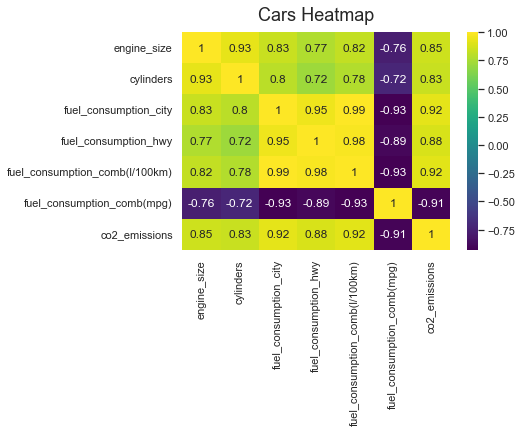

In [106]:
cor = data.corr()
heatmap = sns.heatmap(cor, annot=True , cmap='viridis')
heatmap.set_title('Cars Heatmap', fontdict={'fontsize':18}, pad=12);

In [107]:
from sklearn.preprocessing import LabelEncoder
labelencoder = LabelEncoder()
data1 = data.copy()
data1["transmission"] = labelencoder.fit_transform(data1["transmission"])
data1["fuel_type"] = labelencoder.fit_transform(data1["fuel_type"])
data1.head()

,make,model,vehicle_class,engine_size,cylinders,transmission,fuel_type,fuel_consumption_city,fuel_consumption_hwy,fuel_consumption_comb(l/100km),fuel_consumption_comb(mpg),co2_emissions
0,ACURA,ILX,COMPACT,2.0,4,2,4,9.9,6.7,8.5,33,196
1,ACURA,ILX,COMPACT,2.4,4,4,4,11.2,7.7,9.6,29,221
2,ACURA,ILX HYBRID,COMPACT,1.5,4,3,4,6.0,5.8,5.9,48,136
3,ACURA,MDX 4WD,SUV - SMALL,3.5,6,2,4,12.7,9.1,11.1,25,255
4,ACURA,RDX AWD,SUV - SMALL,3.5,6,2,4,12.1,8.7,10.6,27,244


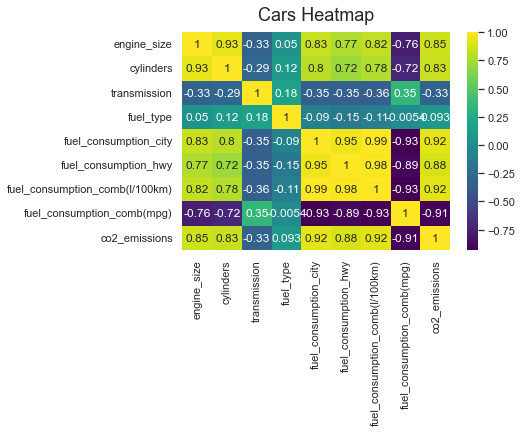

In [108]:
cor = data1.corr()
heatmap = sns.heatmap(cor, annot=True , cmap='viridis')
heatmap.set_title('Cars Heatmap', fontdict={'fontsize':18}, pad=12);

## Outliers

<AxesSubplot:>

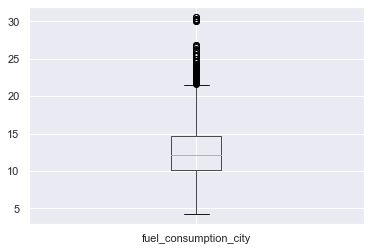

In [109]:
data1.boxplot("fuel_consumption_city")

<AxesSubplot:>

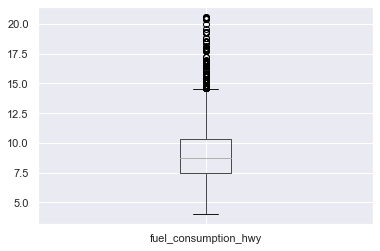

In [110]:
data1.boxplot("fuel_consumption_hwy")

<AxesSubplot:>

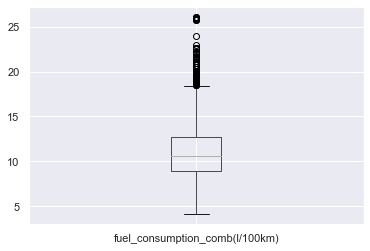

In [111]:
data1.boxplot("fuel_consumption_comb(l/100km)")

<AxesSubplot:>

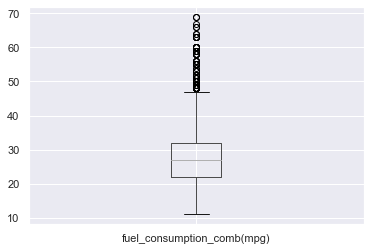

In [112]:
data1.boxplot("fuel_consumption_comb(mpg)")

<AxesSubplot:>

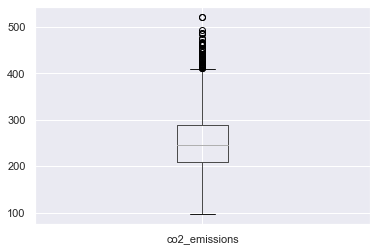

In [113]:
data1.boxplot("co2_emissions")

In [114]:
Q1=data1.quantile(0.25)
Q3=data1.quantile(0.75)
IQR=Q3-Q1
print(IQR)

engine_size                        1.7
cylinders                          2.0
transmission                       1.0
fuel_type                          1.0
fuel_consumption_city              4.6
fuel_consumption_hwy               2.8
fuel_consumption_comb(l/100km)     3.8
fuel_consumption_comb(mpg)        10.0
co2_emissions                     81.0
dtype: float64


In [115]:
data1=data1[~((data1<(Q1-1.5*IQR))|(data1>(Q3+1.5*IQR))).any(axis=1)]
data1.shape

(4454, 12)

<AxesSubplot:>

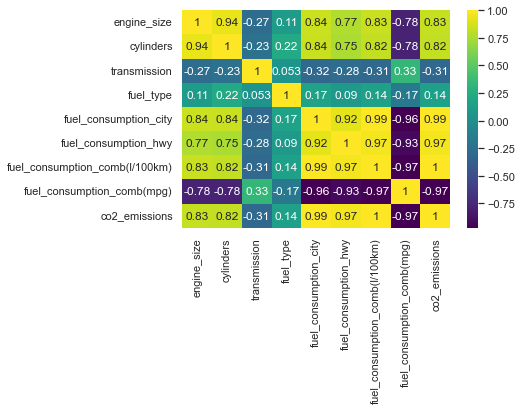

In [116]:
sns.heatmap(data1.corr(), annot=True , cmap='viridis')

## Checking Skewness and Kurtosis

In [117]:
from scipy.stats import skew
from scipy.stats import kurtosis

In [118]:
data1.skew()

engine_size                       0.709158
cylinders                         0.397916
transmission                     -0.468290
fuel_type                         0.145936
fuel_consumption_city             0.281625
fuel_consumption_hwy              0.526755
fuel_consumption_comb(l/100km)    0.351529
fuel_consumption_comb(mpg)        0.561970
co2_emissions                     0.342593
dtype: float64

In [119]:
data1.kurt()

engine_size                      -0.255512
cylinders                        -1.151147
transmission                     -1.048206
fuel_type                        -1.965125
fuel_consumption_city            -0.420910
fuel_consumption_hwy             -0.022431
fuel_consumption_comb(l/100km)   -0.377977
fuel_consumption_comb(mpg)        0.048040
co2_emissions                    -0.410160
dtype: float64

In [120]:
data1.rename(columns={'engine_size': 'engine', 'cylinders': 'cyl', 'fuel_consumption_city': 'fuel_city', 'fuel_consumption_hwy':'fuel_hwy', 'fuel_consumption_comb(l/100km)':'fuel_combo', 'fuel_consumption_comb(mpg)':'fuel_mpg'}, inplace=True)

In [121]:
data1.columns

Index(['make', 'model', 'vehicle_class', 'engine', 'cyl', 'transmission',
       'fuel_type', 'fuel_city', 'fuel_hwy', 'fuel_combo', 'fuel_mpg',
       'co2_emissions'],
      dtype='object')

# Preparing the model

In [122]:
#Build model
import statsmodels.formula.api as smf 
model = smf.ols("co2_emissions ~ engine + cyl + transmission + fuel_type + fuel_city + fuel_hwy + fuel_combo + fuel_mpg",data=data1).fit()

In [123]:
model.params

Intercept        5.818586
engine          -0.162934
cyl              0.251080
transmission    -0.016716
fuel_type       -0.147218
fuel_city        5.878067
fuel_hwy         5.394496
fuel_combo      11.817223
fuel_mpg        -0.102451
dtype: float64

In [124]:
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:          co2_emissions   R-squared:                       0.997
Model:                            OLS   Adj. R-squared:                  0.997
Method:                 Least Squares   F-statistic:                 1.691e+05
Date:                Tue, 19 Apr 2022   Prob (F-statistic):               0.00
Time:                        17:58:24   Log-Likelihood:                -11041.
No. Observations:                4454   AIC:                         2.210e+04
Df Residuals:                    4445   BIC:                         2.216e+04
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
================================================================================
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
Intercept        5.8186      1.847      3.150      0.002       2.197       9.440
engine          -0.1629      0.112     -1.459      0.145      -0.382       0.056
cyl              0.2511      0.088      2.867      0.004       0.079       0.423
transmission    -0.0167      0.048     -0.348      0.728      -0.111       0.077
fuel_type       -0.1472      0.094     -1.559      0.119      -0.332       0.038
fuel_city        5.8781      0.554     10.614      0.000       4.792       6.964
fuel_hwy         5.3945      0.456     11.825      0.000       4.500       6.289
fuel_combo      11.8172      1.006     11.745      0.000       9.845      13.790
fuel_mpg        -0.1025      0.033     -3.138      0.002      -0.166      -0.038
==============================================================================
Omnibus:                     5229.945   Durbin-Watson:                   0.846
Prob(Omnibus):                  0.000   Jarque-Bera (JB):          4080834.589
Skew:                          -5.392   Prob(JB):                         0.00
Kurtosis:                     150.895   Cond. No.                     1.45e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.45e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

### We can see that Pvalue of transmission,  fuel_city,  fuel_hwy,  fuel_combo are more than 0.05 which is insignificant.

In [125]:
#Simple Linear Regression Model for transmission
model_trans=smf.ols("co2_emissions ~ transmission",data = data1 ).fit()  
model_trans.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:          co2_emissions   R-squared:                       0.096
Model:                            OLS   Adj. R-squared:                  0.096
Method:                 Least Squares   F-statistic:                     472.5
Date:                Tue, 19 Apr 2022   Prob (F-statistic):           1.18e-99
Time:                        17:58:25   Log-Likelihood:                -23557.
No. Observations:                4454   AIC:                         4.712e+04
Df Residuals:                    4452   BIC:                         4.713e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
================================================================================
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
Intercept      274.0268      1.302    210.479      0.000     271.474     276.579
transmission   -16.0793      0.740    -21.737      0.000     -17.530     -14.629
==============================================================================
Omnibus:                      132.942   Durbin-Watson:                   0.932
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              142.208
Skew:                           0.428   Prob(JB):                     1.32e-31
Kurtosis:                       2.814   Cond. No.                         3.97
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [126]:
#Simple Linear Regression Model for fuel_city
model_fcity=smf.ols("co2_emissions ~ fuel_city",data = data1 ).fit()  
model_fcity.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:          co2_emissions   R-squared:                       0.977
Model:                            OLS   Adj. R-squared:                  0.977
Method:                 Least Squares   F-statistic:                 1.892e+05
Date:                Tue, 19 Apr 2022   Prob (F-statistic):               0.00
Time:                        17:58:26   Log-Likelihood:                -15380.
No. Observations:                4454   AIC:                         3.076e+04
Df Residuals:                    4452   BIC:                         3.078e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     16.1580      0.551     29.344      0.000      15.078      17.238
fuel_city     19.0899      0.044    434.965      0.000      19.004      19.176
==============================================================================
Omnibus:                      526.549   Durbin-Watson:                   0.857
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             5396.502
Skew:                          -0.051   Prob(JB):                         0.00
Kurtosis:                       8.391   Cond. No.                         60.7
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [127]:
#Simple Linear Regression Model for fuel_hwy
model_fhwy=smf.ols("co2_emissions ~ fuel_hwy",data = data1 ).fit()  
model_fhwy.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:          co2_emissions   R-squared:                       0.933
Model:                            OLS   Adj. R-squared:                  0.933
Method:                 Least Squares   F-statistic:                 6.243e+04
Date:                Tue, 19 Apr 2022   Prob (F-statistic):               0.00
Time:                        17:58:26   Log-Likelihood:                -17747.
No. Observations:                4454   AIC:                         3.550e+04
Df Residuals:                    4452   BIC:                         3.551e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     -4.0528      1.037     -3.908      0.000      -6.086      -2.020
fuel_hwy      28.6453      0.115    249.869      0.000      28.421      28.870
==============================================================================
Omnibus:                      156.309   Durbin-Watson:                   1.070
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              440.772
Skew:                          -0.059   Prob(JB):                     1.94e-96
Kurtosis:                       4.537   Cond. No.                         48.7
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [128]:
#Simple Linear Regression Model
model_fcombo=smf.ols("co2_emissions ~ fuel_combo",data = data1 ).fit()  
model_fcombo.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:          co2_emissions   R-squared:                       0.997
Model:                            OLS   Adj. R-squared:                  0.997
Method:                 Least Squares   F-statistic:                 1.306e+06
Date:                Tue, 19 Apr 2022   Prob (F-statistic):               0.00
Time:                        17:58:27   Log-Likelihood:                -11122.
No. Observations:                4454   AIC:                         2.225e+04
Df Residuals:                    4452   BIC:                         2.226e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      0.3391      0.223      1.519      0.129      -0.099       0.777
fuel_combo    23.2689      0.020   1142.784      0.000      23.229      23.309
==============================================================================
Omnibus:                     5152.634   Durbin-Watson:                   0.827
Prob(Omnibus):                  0.000   Jarque-Bera (JB):          3870803.756
Skew:                          -5.248   Prob(JB):                         0.00
Kurtosis:                     147.039   Cond. No.                         56.0
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

## Calculating VIF for only transmission,  fuel_city,  fuel_hwy,  fuel_combo  because Pvalue is insignificant for us.

In [129]:
rsq_trans= smf.ols("transmission ~ fuel_city + fuel_hwy + fuel_combo",data=data1).fit().rsquared  
vif_trans = 1/(1-rsq_trans) 

rsq_fuel_city= smf.ols("fuel_city ~ transmission + fuel_hwy + fuel_combo",data=data1).fit().rsquared  
vif_fuel_city = 1/(1-rsq_fuel_city)

rsq_fuel_hwy= smf.ols("fuel_hwy ~ fuel_city + transmission + fuel_combo",data=data1).fit().rsquared  
vif_fuel_hwy = 1/(1-rsq_fuel_hwy) 

rsq_fuel_combo= smf.ols("fuel_combo ~ fuel_city + transmission + fuel_hwy",data=data1).fit().rsquared  
vif_fuel_combo = 1/(1-rsq_fuel_combo) 

# Storing vif values in a data frame
d1 = {'Variables':["transmission","fuel_city","fuel_hwy","fuel_combo"],'VIF':[vif_trans,vif_fuel_city,vif_fuel_hwy,vif_fuel_combo]}
Vif_frame = pd.DataFrame(d1)  
Vif_frame

,Variables,VIF
0,transmission,1.111636
1,fuel_city,1113.110111
2,fuel_hwy,320.277629
3,fuel_combo,2508.809496


In [130]:
from sklearn.preprocessing import LabelEncoder
labelencoder = LabelEncoder()
data = data1.copy()
data["vehicle_class"] = labelencoder.fit_transform(data["vehicle_class"])
data.head()

,make,model,vehicle_class,engine,cyl,transmission,fuel_type,fuel_city,fuel_hwy,fuel_combo,fuel_mpg,co2_emissions
0,ACURA,ILX,0,2.0,4,2,4,9.9,6.7,8.5,33,196
3,ACURA,MDX 4WD,11,3.5,6,2,4,12.7,9.1,11.1,25,255
4,ACURA,RDX AWD,11,3.5,6,2,4,12.1,8.7,10.6,27,244
5,ACURA,RLX,2,3.5,6,2,4,11.9,7.7,10.0,28,230
6,ACURA,TL,2,3.5,6,2,4,11.8,8.1,10.1,28,232


In [131]:
data=data.drop("model", axis=1)
data=data.drop("make", axis=1)

In [132]:
data.head()

,vehicle_class,engine,cyl,transmission,fuel_type,fuel_city,fuel_hwy,fuel_combo,fuel_mpg,co2_emissions
0,0,2.0,4,2,4,9.9,6.7,8.5,33,196
3,11,3.5,6,2,4,12.7,9.1,11.1,25,255
4,11,3.5,6,2,4,12.1,8.7,10.6,27,244
5,2,3.5,6,2,4,11.9,7.7,10.0,28,230
6,2,3.5,6,2,4,11.8,8.1,10.1,28,232


In [133]:
array = data.values
X = array[:,0:9]
Y = array[:,9]

In [134]:
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.33, random_state=10)

## Feature Engineering- Method1

In [135]:
# feature extraction
from sklearn.feature_selection import RFE
model = LinearRegression()


rfe = RFE(model, n_features_to_select=4)
fit = rfe.fit(X, Y)

fit.n_features_
fit.support_
fit.ranking_

array([6, 2, 1, 5, 3, 1, 1, 1, 4])

## Feature Engineering- Method2

In [136]:
from sklearn.ensemble import ExtraTreesClassifier
# feature extraction
model = ExtraTreesClassifier()
model.fit(X, Y)

print(model.feature_importances_)

[0.10102729 0.10064075 0.01821686 0.06531691 0.03084411 0.19181414
 0.20258719 0.20694939 0.08260335]


# Model Validation Methods
## Linear Regression 

In [137]:
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.33, random_state=10)

model_lr = LinearRegression()
model_lr.fit(X_train,Y_train)
model_pred_lr = model_lr.predict(X_test)

model_accuracy_Linear=r2_score(Y_test,model_pred_lr)
print('Linear Regression: ',model_accuracy_Linear)

Linear Regression:  0.9949800905275695


## Linear Regression crossvalidation

In [138]:
model_lr = LinearRegression()
model_lr.fit(X_train, Y_train)
model_lr.score(X_test, Y_test)

0.9949800905275695

## Ridge Regression

In [139]:
from sklearn.linear_model import Ridge
model_r = Ridge(alpha = 1)
model_r.fit(X_train,Y_train)
model_pred_r = model_r.predict(X_test)

model_accuracy_Ridge=r2_score(Y_test,model_pred_r)
print('Ridge: ',model_accuracy_Ridge)

Ridge:  0.9949828644509044


In [140]:
model_r.score(X_train,Y_train)

0.9975193831968933

## Lasso Regression

In [141]:
from sklearn.linear_model import Lasso
model_las = Lasso(alpha = 0.005)
model_las.fit(X_train,Y_train)
model_pred_las = model_las.predict(X_test)

model_accuracy_Lasso=r2_score(Y_test,model_pred_las)
print('Lasso: ',model_accuracy_Lasso)

Lasso:  0.9949383815024052


In [142]:
model_las.score(X_train,Y_train)

0.9974412275889157

## DecisionTree Regression

In [143]:
from sklearn.tree import DecisionTreeRegressor
model_dt=DecisionTreeRegressor()
model_dt.fit(X_train,Y_train)
model_pred_dt = model_dt.predict(X_test)

model_accuracy_DecisionTree =r2_score(Y_test,model_pred_dt)
print('Decision Tree: ',model_accuracy_DecisionTree)

Decision Tree:  0.9937919308860416


In [144]:
model_dt.score(X_train,Y_train)

0.9996588365478567

## Gaussian Naive Bayes

In [145]:
# Gaussian Naive Bayes 
from sklearn.naive_bayes import GaussianNB
from sklearn.model_selection import KFold

kfold = KFold(n_splits=10)
model_NB = GaussianNB()
model_NB.fit(X_train,Y_train)
model_pred_NB =model_NB.predict(X_test)

model_accuracy_Gaussion_NB =r2_score(Y_test,model_pred_NB)
print('Gaussian Naive Bayes: ',model_accuracy_Gaussion_NB)

Gaussian Naive Bayes:  0.9910966997552884


In [146]:
model_NB.score(X_train,Y_train)

0.2754691689008043

## KNN 

In [147]:
# KNN 
from sklearn.neighbors import KNeighborsRegressor

kfold = KFold(n_splits=10)
model_KNN = KNeighborsRegressor()
model_KNN.fit(X_train,Y_train)
model_pred_KNN = model_KNN.predict(X_test)

model_accuracy_KNN=r2_score(Y_test,model_pred_KNN)
print('KNN: ',model_accuracy_KNN)

KNN:  0.9917148573396303


In [148]:
model_KNN.score(X_train,Y_train)

0.9965746733803852

## Support Vector Classifier

In [149]:
from sklearn.svm import SVC

kfold = KFold(n_splits=10)

model_svc = SVC()
model_svc.fit(X_train,Y_train)
model_pred_svc = model_svc.predict(X_test)

model_accuracy_SVC=r2_score(Y_test,model_pred_svc)
print('SVC: ',model_accuracy_SVC)

SVC:  0.8819153616075989


In [150]:
model_svc.score(X_train,Y_train)

0.05529490616621984

## AdaBoost

In [151]:
# AdaBoost Regression
from sklearn.ensemble import AdaBoostRegressor

num_trees = 10

kfold = KFold(n_splits=10)
model_ada = AdaBoostRegressor()

model_ada.fit(X_train,Y_train)
model_pred_ada = model_ada.predict(X_test)

model_accuracy_AdaBoost=r2_score(Y_test,model_pred_ada)
print('AdaBoost: ',model_accuracy_AdaBoost)

AdaBoost:  0.9927683566376182


In [152]:
model_ada.score(X_train,Y_train)

0.9957366805467536

## Bagged Decision Tree

In [153]:
# Bagged Decision Trees for Regression

from sklearn.ensemble import BaggingRegressor
from sklearn.tree import DecisionTreeRegressor


kfold = KFold(n_splits=10)
cart = DecisionTreeRegressor()
num_trees = 100
model_bdt = BaggingRegressor(base_estimator=cart, n_estimators=num_trees)

model_bdt.fit(X_train,Y_train)
model_pred_bdt = model_bdt.predict(X_test)

model_accuracy_Bagged_DecisionTree=r2_score(Y_test,model_pred_bdt)
print('Bagged Decision: ',model_accuracy_Bagged_DecisionTree)

Bagged Decision:  0.9950485892210292


In [154]:
model_bdt.score(X_train,Y_train)

0.9994158004422508

## Random Forest

In [155]:
# Random Forest Regression
from sklearn.ensemble import RandomForestRegressor

model_RF = RandomForestRegressor()

model_RF.fit(X_train,Y_train)
model_pred_RF = model_RF.predict(X_test)

model_accuracy_RF=r2_score(Y_test,model_pred_RF)
print('Random Forest: ',model_accuracy_RF)

Random Forest:  0.9950212111304416


In [156]:
model_RF.score(X_train,Y_train)

0.9994151454000839

In [157]:
model_accuracy=pd.Series([model_accuracy_Linear,model_accuracy_Ridge,model_accuracy_Lasso,model_accuracy_DecisionTree,model_accuracy_Gaussion_NB,model_accuracy_KNN,model_accuracy_SVC,model_accuracy_AdaBoost,model_accuracy_Bagged_DecisionTree,model_accuracy_RF])

In [158]:
models=pd.Series(["Linear Regression","Ridge Regression","Lasso Regression","Decision Tree","Gaussian Naive Bayes","KNN","Support Vector Classifier","AdaBoost","Bagged Decision Tree","Random Forest"])

In [159]:
data={'Model':models,'Accuracy':model_accuracy}

In [160]:
data_accuracy=pd.DataFrame(data)

In [161]:
data_accuracy

,Model,Accuracy
0,Linear Regression,0.994980
1,Ridge Regression,0.994983
2,Lasso Regression,0.994938
3,Decision Tree,0.993792
4,Gaussian Naive Bayes,0.991097
5,KNN,0.991715
6,Support Vector Classifier,0.881915
7,AdaBoost,0.992768
8,Bagged Decision Tree,0.995049
9,Random Forest,0.995021
